# DriXMed22 surface ctd data

- maps variability
- compare with satellite data


In [1]:
import os

import numpy as np
import pandas as pd
import xarray as xr

%matplotlib inline
import matplotlib.pyplot as plt
import hvplot.xarray  # noqa
import hvplot.pandas  # noqa

import pynsitu as pin
crs = pin.maps.crs

/Users/aponte/.miniconda3/envs/pynsitu/lib/python3.10/site-packages/pyTMD/tools.py:55: UserWarning: ipyleaflet not available
  warnings.warn("ipyleaflet not available")
/Users/aponte/.miniconda3/envs/pynsitu/lib/python3.10/site-packages/pyTMD/tools.py:56: UserWarning: Some functions will throw an exception if called
  warnings.warn("Some functions will throw an exception if called")


---
## load data

In [2]:
campaign = "drixmed22"
root_dir = "/Users/aponte/Code/drix_analysis/" + campaign
yaml = f"{campaign}.yaml"

# load campaign object
cp = pin.campaign(os.path.join(root_dir, yaml))

# plotting utils
kwargs_map = dict(extent=cp.lon + cp.lat, bathy=cp.bathy["label"])

underway
tide_gauge
adcp_europe
adcp_drix
ctd_europe
ctd_drix
0-4350125
0-4352044
0-4350124
0-4352185
0-4351896
0-4352181


In [3]:
# europe
europe = cp.load("europe_underway_10s.nc").set_coords(["lon", "lat"])

# drix
drix = cp.load("drix_underway_ctd_10s.nc").set_coords(["lon", "lat"])
drix_met = cp.load("drix_met_10s.nc")
drix_ins = cp.load("drix_ins_10s.nc").sortby("time")

# ctd
u = "ctd_europe"
ctd = {d.label: cp.load(f"{u}_{d.label}.nc") for d in cp[u]}

# meteo
arome = cp.load("met_arome.nc")

# load drifters
dr = cp.load("drifters.nc").to_dataframe()

In [4]:
# interpolate arome on DriX trajectory
# _u10 = arome.u10m.interp(longitude=europe_underway.long, latitude=europe_underway.long, time=europe_underway.time)
# arome["u10m"].isel(longitude=10, latitude=10).plot()

---
## define and plot sections 

Use hvplot + overview figure of campaign activities

In [5]:
kwargs = dict(grid=True)

_temp = (europe.temp.hvplot(x="time", label="europe tsg", **kwargs) 
*drix.temp_miniCT.hvplot(x="time", label="drix miniCT", **kwargs)
*drix.temp_legato.hvplot(x="time", label="drix legato", **kwargs)
)
_sal = (europe.salinity.hvplot(x="time", label="europe tsg", **kwargs) 
*drix.salinity_miniCT.hvplot(x="time", label="drix miniCT", **kwargs)
*drix.salinity_legato.hvplot(x="time", label="drix legato", **kwargs)
)
_lon = (europe.reset_coords().lon.hvplot(x="time", label="europe", **kwargs) 
*drix.reset_coords().lon.hvplot(x="time", label="drix", **kwargs)
)
_lat = (europe.reset_coords().lat.hvplot(x="time", label="europe", **kwargs) 
*drix.reset_coords().lat.hvplot(x="time", label="drix", **kwargs)
)
(_temp+_sal+_lon+_lat).cols(1)

:Layout
   .Overlay.I   :Overlay
      .Curve.Europe_tsg  :Curve   [time]   (temp)
      .Curve.Drix_miniCT :Curve   [time]   (temp_miniCT)
      .Curve.Drix_legato :Curve   [time]   (temp_legato)
   .Overlay.II  :Overlay
      .Curve.Europe_tsg  :Curve   [time]   (salinity)
      .Curve.Drix_miniCT :Curve   [time]   (salinity_miniCT)
      .Curve.Drix_legato :Curve   [time]   (salinity_legato)
   .Overlay.III :Overlay
      .Curve.Europe :Curve   [time]   (lon)
      .Curve.Drix   :Curve   [time]   (lon)
   .Overlay.IV  :Overlay
      .Curve.Europe :Curve   [time]   (lat)
      .Curve.Drix   :Curve   [time]   (lat)

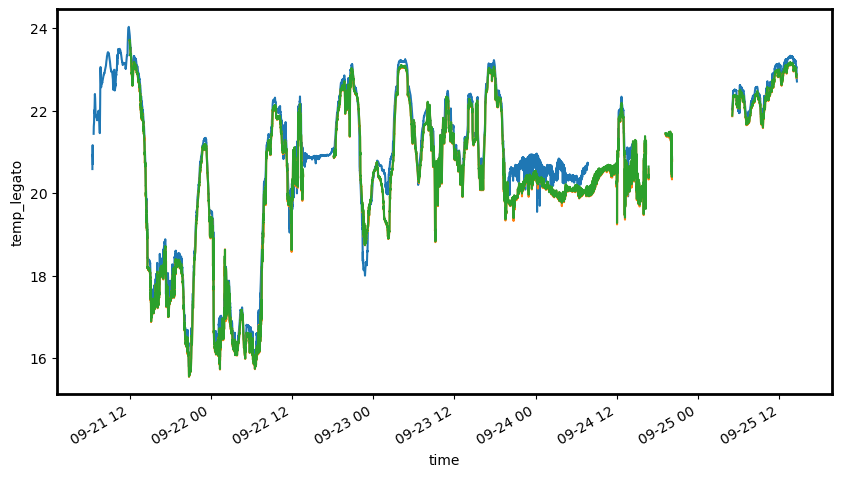

In [6]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
europe.temp.plot(label="europe tsg")
drix.temp_miniCT.plot(label="drix miniCT")
drix.temp_legato.plot(label="drix miniCT")

In [7]:
sections = dict(initial_transit=(pd.Timestamp("2022/09/21 08:30:00"), pd.Timestamp("2022/09/21 23:00:00")),
                plume_sampling=(pd.Timestamp("2022/09/21 23:00:00"), pd.Timestamp("2022/09/22 13:45:00")),
                drifter_deployment=(pd.Timestamp("2022/09/22 18:00:00"), pd.Timestamp("2022/09/23 19:50:00")),
                final_transit=(pd.Timestamp("2022/09/25 04:45:00"), pd.Timestamp("2022/09/25 14:50:00")),
               )

In [12]:
def plot_all_fields(europe, drix, label):

    fig, axes = plt.subplots(4,2, figsize=(13,7), sharex=True)

    plot_row(europe, drix, "temp", 0, axes, "[degC]", label)
    plot_row(europe, drix, "salinity", 1, axes, "[psu]", label)

    ax = axes[2,0]
    europe["lon"].plot(ax=ax, label="europe tsg")
    drix["lon"].plot(ax=ax, label="drix")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    ax.set_ylabel("lon [deg]")

    ax = axes[2,1]
    _ds = xr.merge([europe["lon"].rename("europe"), 
                    drix["lon"].rename("drix"),
                   ], compat='override')
    (_ds.europe-_ds.drix).plot(ax=ax, label="europe - miniCT")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")

    ax = axes[3,0]
    europe["lat"].plot(ax=ax, label="europe tsg")
    drix["lat"].plot(ax=ax, label="drix")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")
    ax.set_ylabel("lat [deg]")

    ax = axes[3,1]
    _ds = xr.merge([europe["lat"].rename("europe"), 
                    drix["lat"].rename("drix"),
                   ], compat='override')
    (_ds.europe-_ds.drix).plot(ax=ax, label="europe - miniCT")
    ax.legend()
    ax.grid()
    ax.set_xlabel("")

def plot_row(europe, drix, v, i, axes, units, label):
    first_row = (i==0)
    last_row = (i==axes.shape[0]-1)
    
    ax = axes[i,0]
    europe[v].plot(ax=ax, label="europe tsg")
    drix[v+"_miniCT"].plot(ax=ax, label="drix miniCT")
    drix[v+"_legato"].plot(ax=ax, label="drix miniCT")
    ax.legend()
    ax.grid()
    if last_row:
        ax.tick_params(labelrotation=45)
    else:
        ax.set_xlabel("")
    if first_row:
        ax.set_title(label+", full fields")
    ax.set_ylabel(units)

    ax = axes[i,1]
    _ds = xr.merge([europe[v].rename("europe"), 
                    drix[v+"_miniCT"].rename("miniCT"), 
                    drix[v+"_legato"].rename("legato"),
                   ], compat='override')
    (_ds.europe-_ds.miniCT).plot(ax=ax, label="europe - miniCT")
    (_ds.legato-_ds.miniCT).plot(ax=ax, label="legato - miniCT")
    ax.legend()
    ax.grid()
    if last_row:
        ax.tick_params(labelrotation=45)
    else:
        ax.set_xlabel("")        
    if first_row:
        ax.set_title(label+", differences")


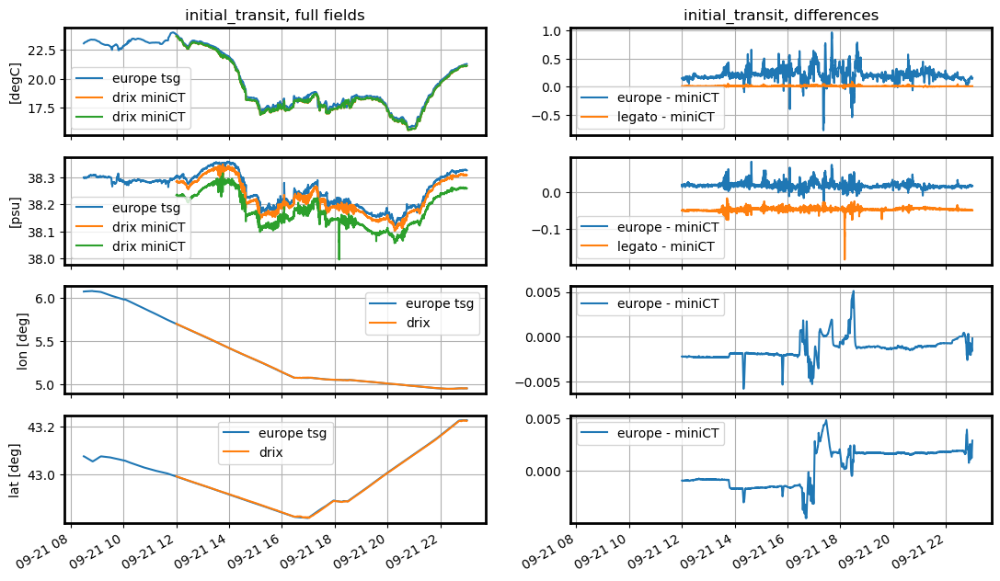

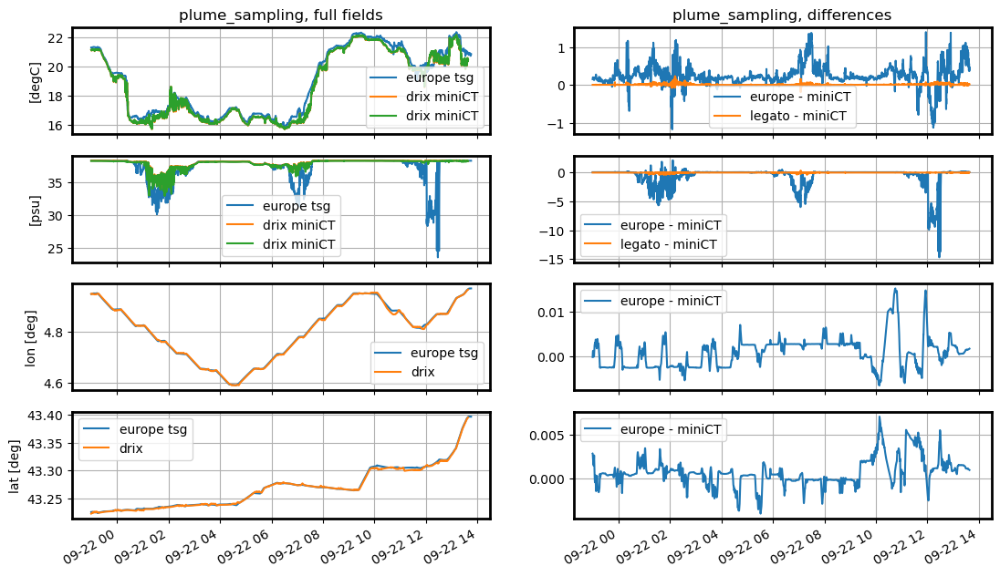

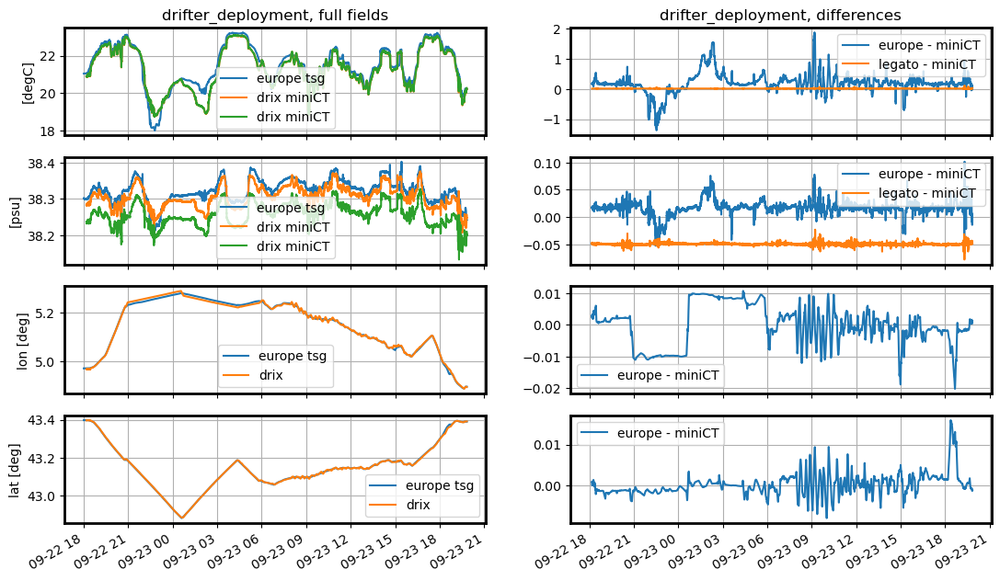

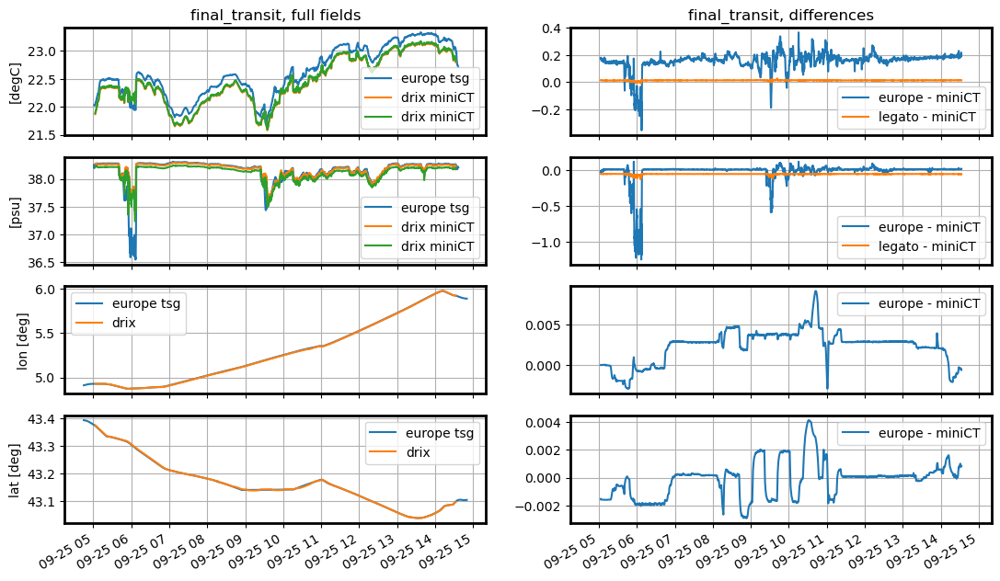

In [14]:
#label = "initial_transit"
#s = sections[label]

for label, s in sections.items():

    _europe = europe.sel(time=slice(s[0], s[1]))
    _drix = drix.sel(time=slice(s[0], s[1]))

    plot_all_fields(_europe, _drix, label)


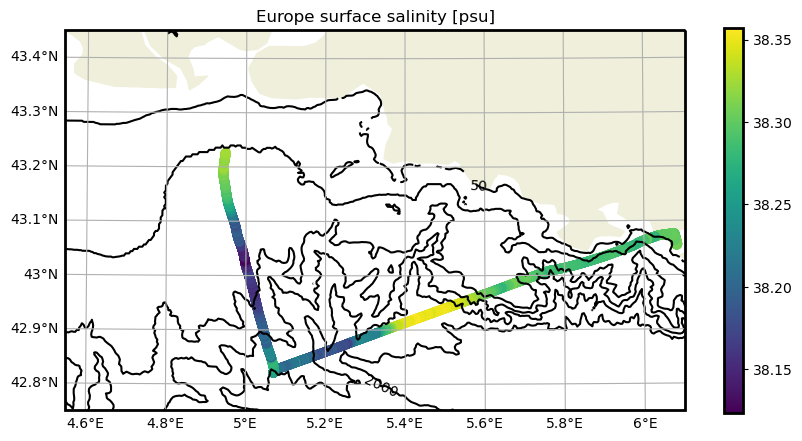

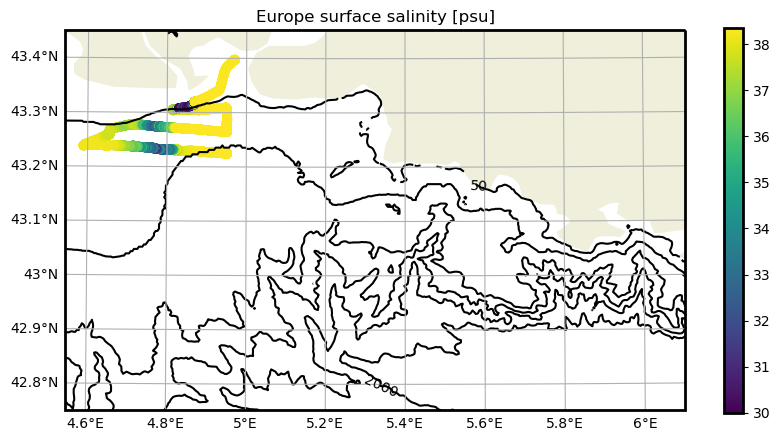

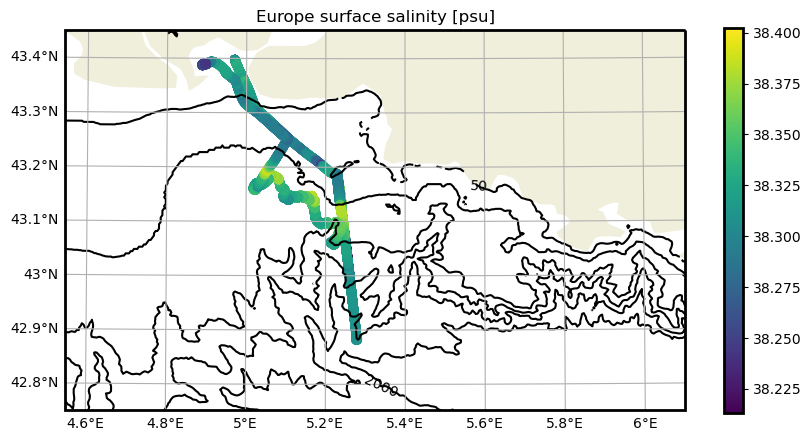

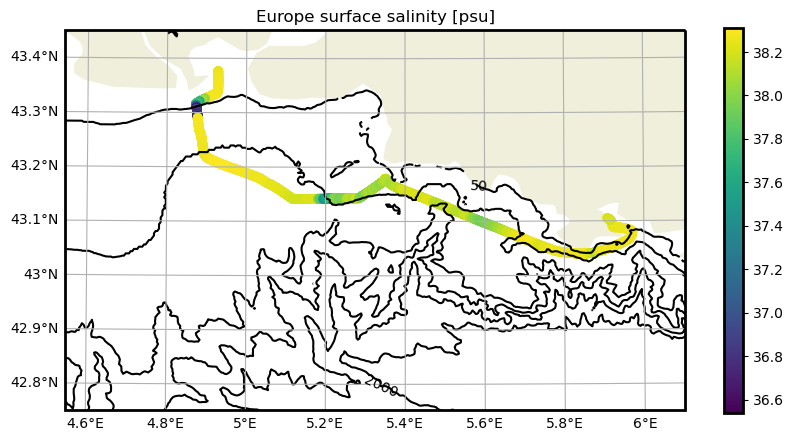

In [18]:

for label, s in sections.items():

    _europe = europe.sel(time=slice(s[0], s[1]))
    _drix = drix.sel(time=slice(s[0], s[1]))

    da = _europe.salinity

    fac = pin.maps.plot_map(**kwargs_map, bathy_levels=cp.bathy["levels"])
    fig, ax = fac["fig"], fac["ax"]
    im = ax.scatter(da.lon, da.lat, c=da, transform=crs, vmin=max(float(da.min()), 30))
    fig.colorbar(im, ax=ax)
    ax.set_title("Europe surface salinity [psu]")

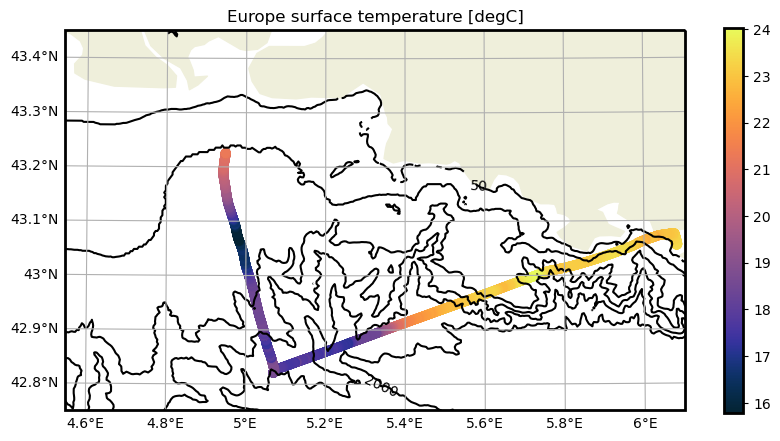

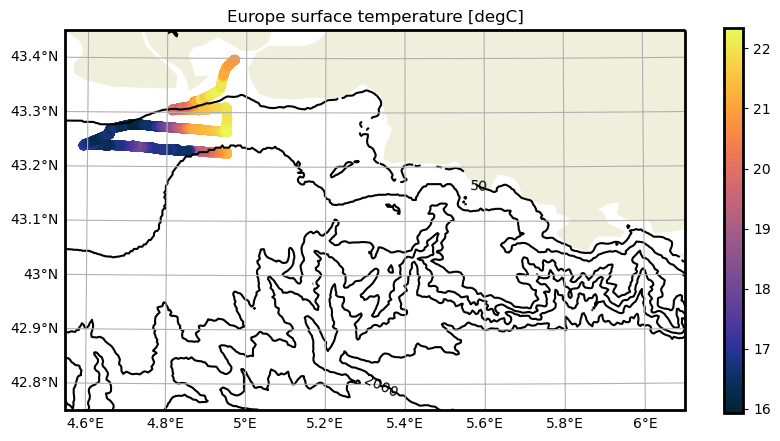

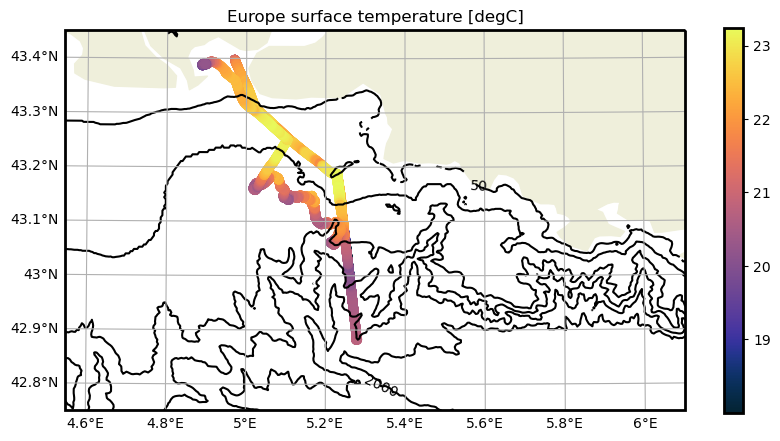

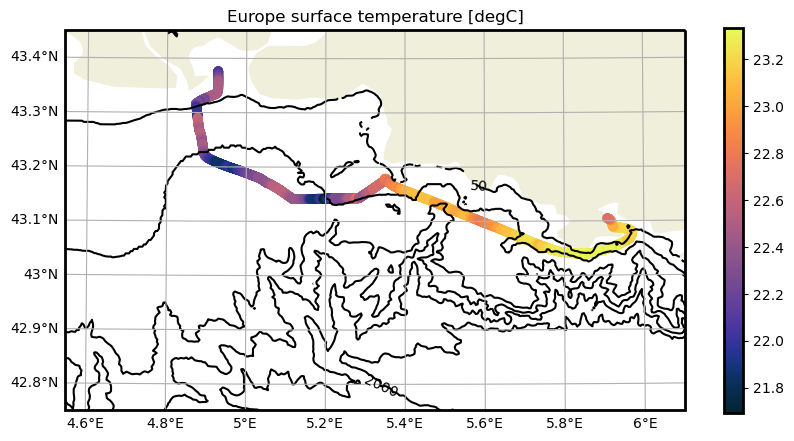

In [21]:

for label, s in sections.items():

    _europe = europe.sel(time=slice(s[0], s[1]))
    _drix = drix.sel(time=slice(s[0], s[1]))

    da = _europe.temp

    fac = pin.maps.plot_map(**kwargs_map, bathy_levels=cp.bathy["levels"])
    fig, ax = fac["fig"], fac["ax"]
    im = ax.scatter(da.lon, da.lat, c=da, transform=crs, cmap=pin.maps.cm.thermal)
    fig.colorbar(im, ax=ax)
    ax.set_title("Europe surface temperature [degC]")